### PupilAnalysis_Pain - Data Processing
- Perform signal processing and preprocessing
    - Remove empty cells (outliers)
    - Calculate signal loss
    - Rebuild signal loss intervals (data missing)
    - Smooth the signal

### Step 0: Load Necessary Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
from scipy.signal import savgol_filter
from tqdm import tqdm
import time
from skimage import io
import seaborn as sns
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd

### Step 1: Load the dataset

In [2]:
# Enter the path where the exported database was stored
# Put the letter r before the path to avoid misinterpretation of the backslash
df = pd.read_csv(r"C:\Users\Rafae\Desktop\Emotion_Effect\Wilson2019\Emotion_Pictures_VF_Data_Export.tsv", sep="\t") #Read file

### Step 2: View loaded data properties

In [3]:
# Check in which pupil there was the greatest signal loss
# Print number of valid Samples (without NaN) from the Left Pupil
print("Left pupil samples:",df.PupilLeft.count())
# Print number of valid Samples (without NaN) from the Right Pupil
print("Right pupil samples:",df.PupilRight.count()) 

Left pupil samples: 2763803
Right pupil samples: 2763671


In [4]:
# Filter NaN and print name of all stimuli
print("Stimuli:",np.unique(df[df["MediaName"].notna()].MediaName)) 

Stimuli: ['1710.jpg' '2040.jpg' '2045.jpg' '2050.jpg' '2058.jpg' '2080.jpg'
 '2205.jpg' '2722.jpg' '3220.jpg' '6010.jpg' '7150.jpg' '7175.jpg'
 '7190.jpg' '7211.jpg' '7224.jpg' '7233.jpg' '7490.jpg' '7520.jpg'
 '7521.jpg' '7705.jpg' '8501.jpg' '8502.jpg' '8503.jpg' '9000.jpg'
 '9001.jpg' '9220.jpg']


In [5]:
# Prints the identification of all subjects
print("ParticipantName:",np.unique(df.ParticipantName)) 

ParticipantName: ['P02' 'P03' 'P04' 'P05' 'P06' 'P07' 'P08' 'P09' 'P10' 'P11' 'P12' 'P13'
 'P14' 'P15' 'P17' 'P18' 'P19' 'P20' 'P21' 'P22' 'P23' 'P24' 'P25' 'P26'
 'P27' 'P28' 'P29' 'P30' 'P31' 'P32']


In [6]:
# Check if it is necessary to exclude or convert the type of some variable
print(df.info()) # Print summary of data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3189431 entries, 0 to 3189430
Data columns (total 7 columns):
 #   Column             Dtype  
---  ------             -----  
 0   ParticipantName    object 
 1   RecordingName      object 
 2   RecordingDuration  int64  
 3   MediaName          object 
 4   PupilLeft          float64
 5   PupilRight         float64
 6   Unnamed: 6         float64
dtypes: float64(3), int64(1), object(3)
memory usage: 170.3+ MB
None


### Step 3: Organize and clean the dataset
- In this step, instead of excluding the data that you are not going to use, select only the data that you are going to use and overwrite the database

In [7]:
# Select only the columns you are going to user
df = df[['ParticipantName','MediaName','PupilLeft']]
# Rename the Pupil with the most recorded samples to "Pupil"
df.rename(columns = {'PupilLeft':'Pupil'}, inplace = True)
display(df)

,ParticipantName,MediaName,Pupil
0,P02,NaN,3.22
1,P02,NaN,3.25
2,P02,NaN,3.25
3,P02,NaN,3.23
4,P02,NaN,3.22
...,...,...,...
3189426,P32,NaN,NaN
3189427,P32,NaN,NaN
3189428,P32,NaN,NaN
3189429,P32,NaN,NaN


In [34]:
# Removed: P11 and P22 (error in interpolating of the P22)
# Removed: P02 and 018 (double size - consider change P by Rec)
p = ['P03', 'P04', 'P05', 'P06', 'P07', 'P08', 'P09', 'P10',
     'P12', 'P13', 'P14', 'P15', 'P17', 'P19', 'P20', 'P21', 
     'P23', 'P24', 'P25', 'P26', 'P27', 'P28', 'P29', 'P30', 'P31', 'P32']

# Select only participants from the list and overwrite the dataset
df = df[df.ParticipantName.isin(p)] 
display(df)

,ParticipantName,MediaName,Pupil
205849,P03,7705.jpg,3.24
205850,P03,7705.jpg,3.21
205851,P03,7705.jpg,3.22
205852,P03,7705.jpg,3.22
205853,P03,7705.jpg,3.16
...,...,...,...
3188091,P32,2045.jpg,3.73
3188092,P32,2045.jpg,3.74
3188093,P32,2045.jpg,3.75
3188094,P32,2045.jpg,3.72


In [35]:
positive = ['8501.jpg', '2080.jpg', '2050.jpg', '2040.jpg', '8502.jpg', '2058.jpg', '1710.jpg', '8503.jpg', '2045.jpg']
neutral =  ['7150.jpg', '7175.jpg', '7190.jpg', '7224.jpg', '7233.jpg', '7490.jpg', '7705.jpg']
negative = ['2722.jpg', '9220.jpg', '7521.jpg', '9001.jpg', '9000.jpg', '2205.jpg', '6010.jpg', '3220.jpg', '7520.jpg']

stimuli = positive+neutral+negative

#Database with heatmap - Removed 7211.png
st = ['8501t.png', '2080t.png', '2050t.png', '2040t.png', '8502t.png', '2058t.png', '1710t.png', '8503t.png', '2045t.png',
      '7150t.png', '7175t.png', '7190t.png', '7224t.png', '7233t.png', '7490t.png', '7705t.png',
      '2722t.png', '9220t.png', '7521t.png', '9001t.png', '9000t.png', '2205t.png', '6010t.png', '3220t.png', '7520t.png']

df = df[df.MediaName.isin(stimuli)] 
display(df)

,ParticipantName,MediaName,Pupil
205849,P03,7705.jpg,3.24
205850,P03,7705.jpg,3.21
205851,P03,7705.jpg,3.22
205852,P03,7705.jpg,3.22
205853,P03,7705.jpg,3.16
...,...,...,...
3188091,P32,2045.jpg,3.73
3188092,P32,2045.jpg,3.74
3188093,P32,2045.jpg,3.75
3188094,P32,2045.jpg,3.72


### Step 4: Fix data type and format

In [36]:
# Replace comma with dot, use regex parameter to apply to df
df["Pupil"] = df["Pupil"].replace(",",".", regex=True)
# Convert data type to numeric (Float)
df["Pupil"] = pd.to_numeric(df["Pupil"]) 
display(df)

,ParticipantName,MediaName,Pupil
205849,P03,7705.jpg,3.24
205850,P03,7705.jpg,3.21
205851,P03,7705.jpg,3.22
205852,P03,7705.jpg,3.22
205853,P03,7705.jpg,3.16
...,...,...,...
3188091,P32,2045.jpg,3.73
3188092,P32,2045.jpg,3.74
3188093,P32,2045.jpg,3.75
3188094,P32,2045.jpg,3.72


### Step 5: Analyze signal loss by participant
- Commonly, the criterion of 70% of valid samples is used
    - Check if the signal acquisition rate is equal to or higher than the stipulated criterion
    - Remove participants with acquisition rate below the criteria

In [37]:
# Declare lists to store the amount of samples
lista1 = []; lista2 = []; lista3 = []  
# Loop repeat to list all participants
for i in p:
    # Filter the participant
    dfi = df["ParticipantName"]==i
    # Filter all samples of the participant
    lista1.append(len(df[dfi]))
    # Filter only samples recorded, without NaN
    lista2.append(len(df[dfi][df[dfi]["Pupil"].notna()]))
    # Calculate rec rate
    lista3.append(len(df[dfi][df[dfi]["Pupil"].notna()])/len(df[dfi]))
# Create Report    
report = pd.DataFrame(data={'AllSamples':lista1,
                            'ValidSamples':lista2,
                            'RecRate':lista3}, index=[p]) 
display(report) 

,AllSamples,ValidSamples,RecRate
P03,45086,42599,0.944839
P04,45107,43999,0.975436
P05,45090,43249,0.959171
P06,45090,44416,0.985052
P07,45085,43886,0.973406
P08,45099,43509,0.964744
P09,45084,43905,0.973849
P10,45089,45007,0.998181
P12,45103,44182,0.979580
P13,45082,44225,0.980990


In [38]:
# Check if there is any participant with acquisition rate below the criteria
criterio = 0.7 # Define criteria (normally 70% is used)
dfc = report['RecRate'] < criterio 
display(report[dfc])
# If you need to remove a participant, edit the 2nd part of step 3

,AllSamples,ValidSamples,RecRate


### Step 6 - Data processing
- Outlier removal
- Reconstruction of signal loss intervals (missing data)
- Signal smoothing to remove noise
- Data normalization (change)

In [39]:
# Replace outliers to NaN
# Define a filter factor for outliers
factor = 0.04 
# Declare an auxiliary DataFrame
df2 = pd.DataFrame(columns=['ParticipantName','MediaName','Pupil']) 

for k in tqdm(range(0,len(p))):
    for j in range(0,len(stimuli)):
        # Filter participant and stimuli
        dftemp = df.loc[(df["ParticipantName"]==p[k])&(df["MediaName"]==stimuli[j])] 
        # Check if there is a difference between samples larger than the factor
        # or if the sample is NaN (in ascending order)
        for i in range(0,len(dftemp)-1):
            dif = abs(dftemp.iat[i,2]-dftemp.iat[i+1,2])
            if dif > factor or math.isnan(dif):
                dftemp.iat[i,2] = np.nan
        # Check if there is a difference between samples larger than the factor
        # or if the sample is NaN (in descending order)  
        for i in range(len(dftemp)-1,0,-1):
            dif = abs(dftemp.iat[i,2]-dftemp.iat[i-1,2])
            if dif > factor or math.isnan(dif):
                dftemp.iat[i,2] = np.nan       
        # Perform signal reconstruction by linear interpolation
        interpolated = dftemp.loc[:,'Pupil'].interpolate(method='linear',
                                                         limit_direction='both') 
        # Smooth the signal to remove noise
        smoothed = savgol_filter(interpolated, 15, 3) 
        # Normalize data variation (change)
        change = smoothed-smoothed[0] 
        for i in range(0,len(dftemp)-1):
            dftemp.iat[i,2] = change[i]
        # Add base signal treated in auxiliary DataFrame    
        df2 = pd.concat([df2,dftemp.iloc[0:1800,0:3]])

100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [12:46<00:00, 29.47s/it]


### Step 7 - Visual analysis of the result

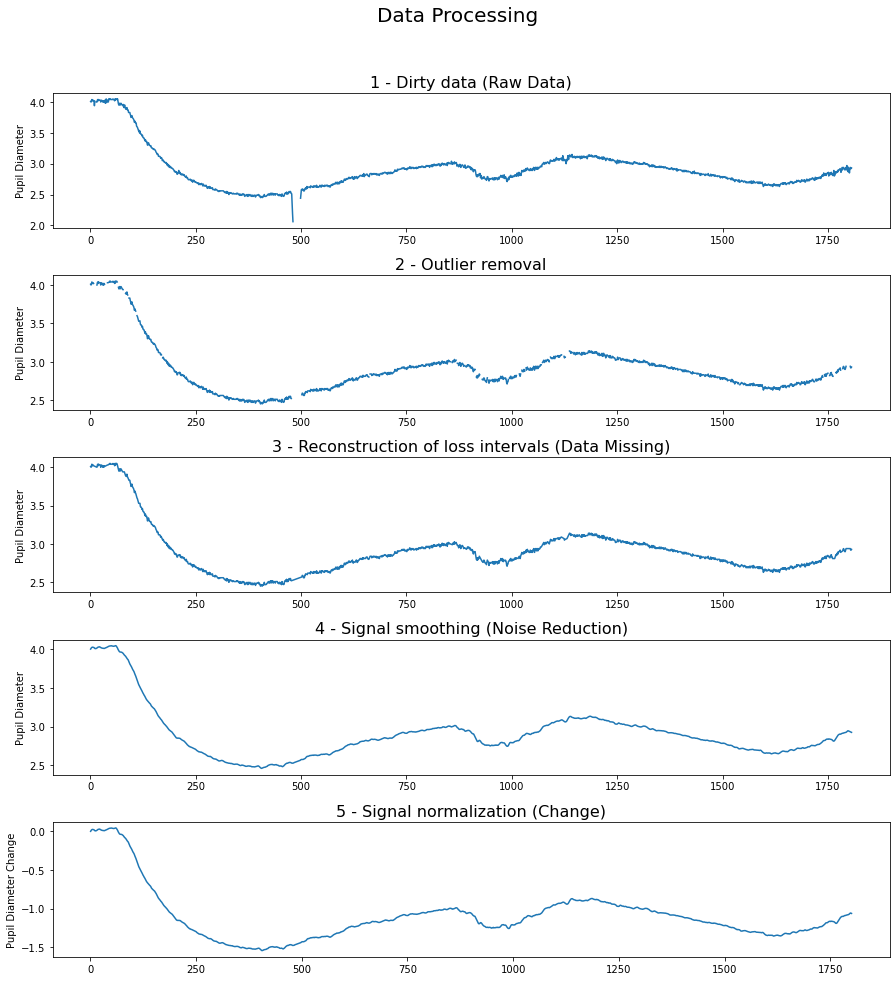

<Figure size 432x288 with 0 Axes>

In [42]:
plt.figure(figsize = (15, 15)) # Set plot area

# Dirty Data
# Filter participant and stimulus
dftemp = df.loc[(df["ParticipantName"]==p[2])&(df["MediaName"]==stimuli[1])] 
x = list(range(1,len(dftemp['Pupil'])+1)) # Set the abscissa axis
y = dftemp["Pupil"] # Print untreated data
plt.subplot(5, 1, 1)
plt.plot(x,y)
plt.title("1 - Dirty data (Raw Data)", fontsize = 16)
plt.ylabel('Pupil Diameter')

# Removal of Outliers
factor = 0.04 # Define a filter factor for outliers
for i in range(0,len(dftemp)-1):
    dif = abs(dftemp.iat[i,2]-dftemp.iat[i+1,2])
    if dif > factor or math.isnan(dif):
        dftemp.iat[i,2] = np.nan
# Check if there is a difference between samples larger than the factor
# or if the sample is NaN (in descending order) 
for i in range(len(dftemp)-1,0,-1):
    dif = abs(dftemp.iat[i,2]-dftemp.iat[i-1,2])
    if dif > factor or math.isnan(dif):
        dftemp.iat[i,2] = np.nan
                
y = dftemp["Pupil"] # Print data without Outliers
plt.subplot(5, 1, 2)
plt.plot(x,y)
plt.title("2 - Outlier removal", fontsize = 16)
plt.ylabel('Pupil Diameter')

# Perform signal reconstruction by linear interpolation
y = dftemp.loc[:,'Pupil'].interpolate(method='linear', limit_direction='both') 
plt.subplot(5, 1, 3)
plt.plot(x,y)
plt.title("3 - Reconstruction of loss intervals (Data Missing)", fontsize = 16)
plt.ylabel('Pupil Diameter')

y = savgol_filter(y, 15, 3) # Smooth the signal to remove noise
x = list(range(1,len(y)+1))
plt.subplot(5, 1, 4)
plt.plot(x,y)
plt.title("4 - Signal smoothing (Noise Reduction)", fontsize = 16)
plt.ylabel('Pupil Diameter')

# Data after all treatment steps
# Filter participant and stimulus
y = df2.loc[(df["ParticipantName"]==p[2])&(df2["MediaName"]==stimuli[1])] 
x = list(range(1,len(y['Pupil'])+1)) # Set the abscissa axis
plt.subplot(5, 1, 5)
plt.plot(x,y['Pupil'])
plt.title("5 - Signal normalization (Change)", fontsize = 16)
plt.ylabel('Pupil Diameter Change')

plt.suptitle("Data Processing", fontsize = 20)
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9,
                    top=0.9, wspace=0.5, hspace=0.35)
plt.show()
plt.savefig('DataProcessing.pdf')

## PupilAnalysis_Pain - Data visualization
- Organize variables of the pupil sign
- Visualize each subject's pupil sign
- Calculate average signal by class
- View average signal by class
- View pupil sign by stimulus
- Analyze the particularities of the pupil sign

### Step 8: Configure functions to generate results

In [43]:
# Function to calculate mean sign by class
def sign_class(classe,id):
    # preallocates space to store pupil sign 
    z = np.zeros(shape=(len(classe), 1800)) 
    k = 0 # Start counter
    for i in classe:
        # Filter subject and stimulus
        w = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==id)] 
        z[k,:]=w['Pupil'] # Store subject's sign 
        k = k+1 # Increment counter
    y = np.mean(z, axis=0) # Calculate the class mean
    x = list(range(1,len(y)+1)) # Set the abscissa axis
    g = plt.plot(x,y) # Print mean sign
    return g

In [44]:
# Function to print original image (stimuli),
# sign of each subject and mean sign by class
def result_id(id1,id2):
    plt.figure(figsize=(15,5)) # Set plot area
    
    plt.subplot(1,2,1) # Set position of subplot
    plt.imshow(io.imread(id2)) # Print orriginal imagem
    plt.title('id: ' + id1, fontsize=13, loc='left') # Set title
    plt.axis('off') # Remove axis
    
    plt.subplot(1,2,2) # Set position of subplot
    for i in p:
        # Filter the subjects and stimuli
        y = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==id1)] 
        x = list(range(1,len(y['Pupil'])+1)) # Set the abscissa axis
        plt.plot(x,y['Pupil']) # Set subject's pupil sign
    plt.title("Pupil sign of all subjects", fontsize = 15) # Insert title
    plt.ylabel('Pupil Diameter Change (mm)') # Insert label of the ordinate axis   
    
    #plt.subplot(2,2,4) # Set position of subplot
    #sign_class(p,id) # Print mean sign
    #plt.legend(['Mean']) # Insert legend
    #plt.title("Mean of pupil sign", fontsize = 15) # Insert title
    #plt.ylabel('Pupil Diameter Change (mm)') # Insert label of the ordinate axis
    return

### Step 9: View characteristics of the pupil sign

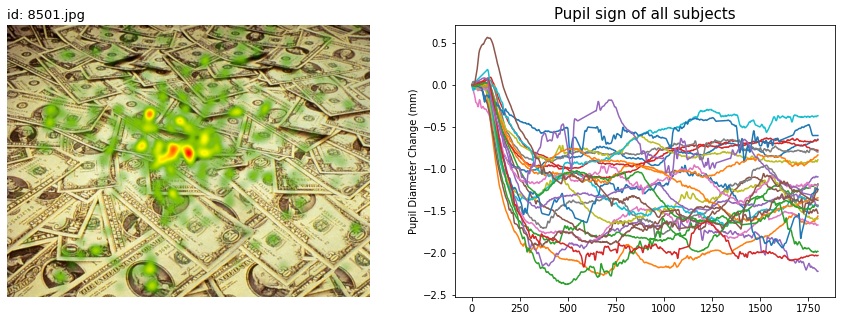

In [45]:
result_id(stimuli[0],st[0]) 

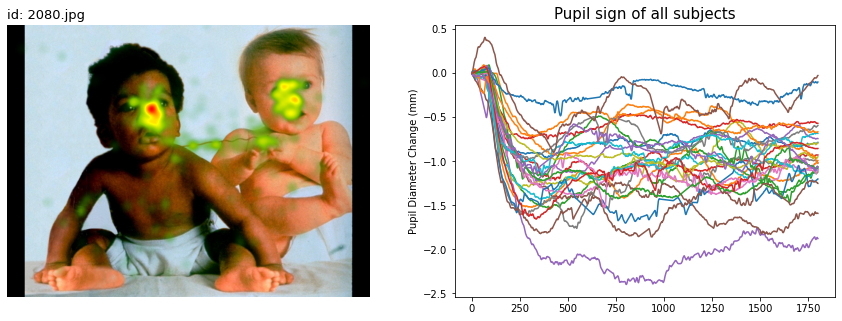

In [46]:
result_id(stimuli[1],st[1]) 

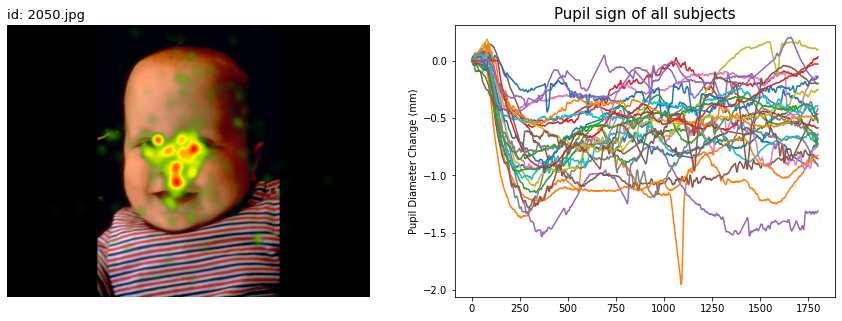

In [47]:
result_id(stimuli[2],st[2]) 

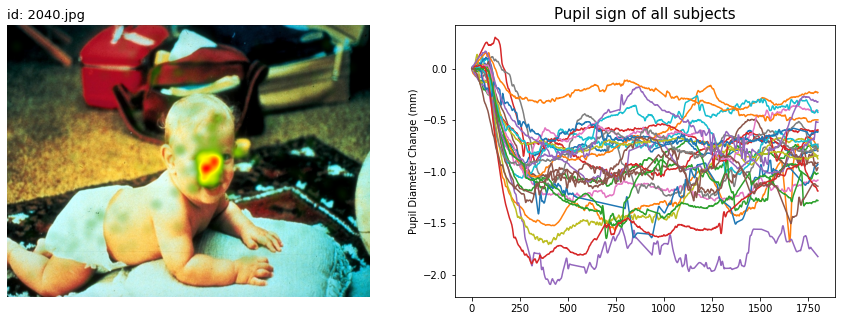

In [48]:
result_id(stimuli[3],st[3]) 

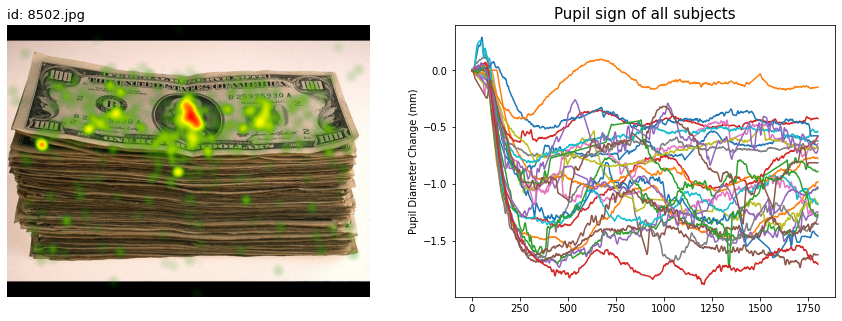

In [49]:
result_id(stimuli[4],st[4]) 

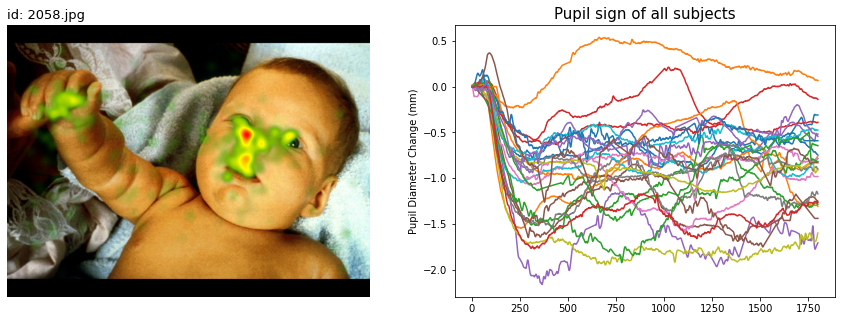

In [50]:
result_id(stimuli[5],st[5]) 

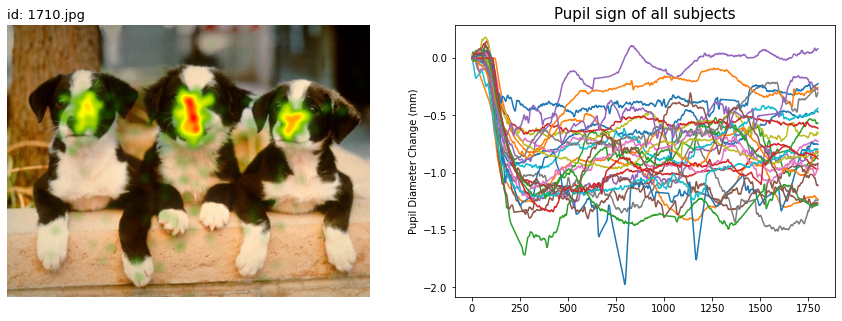

In [51]:
result_id(stimuli[6],st[6]) 

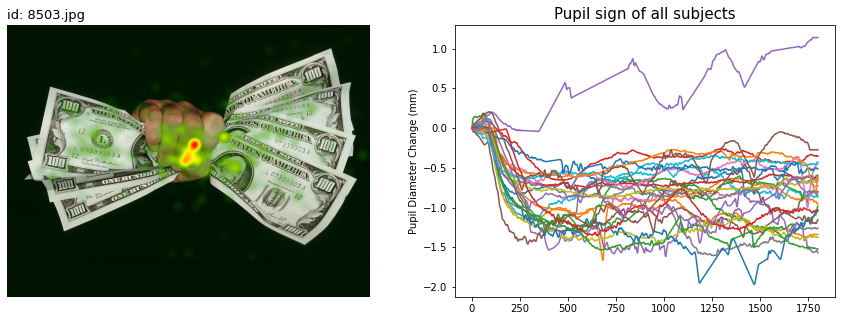

In [52]:
result_id(stimuli[7],st[7]) 

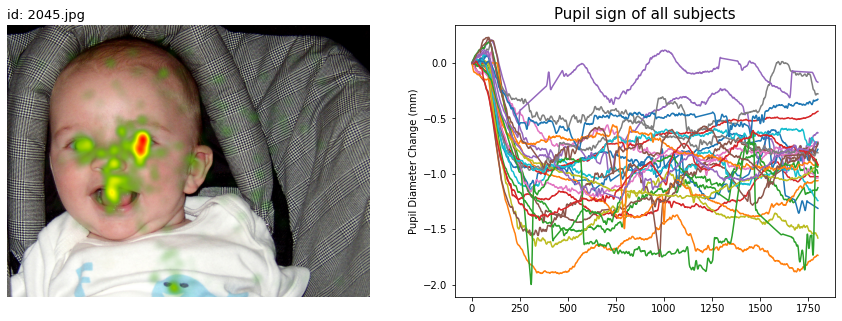

In [53]:
result_id(stimuli[8],st[8])

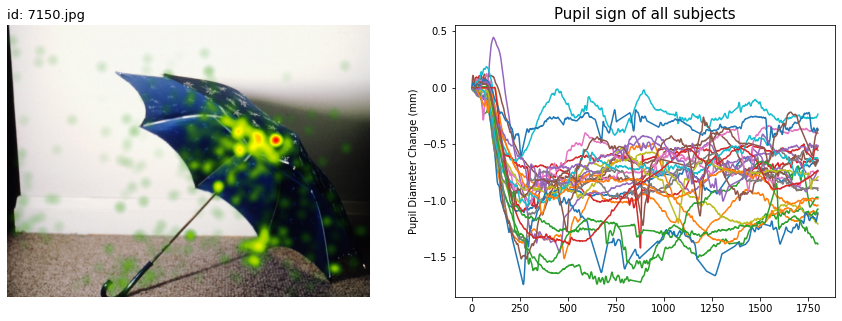

In [54]:
result_id(stimuli[9],st[9]) 

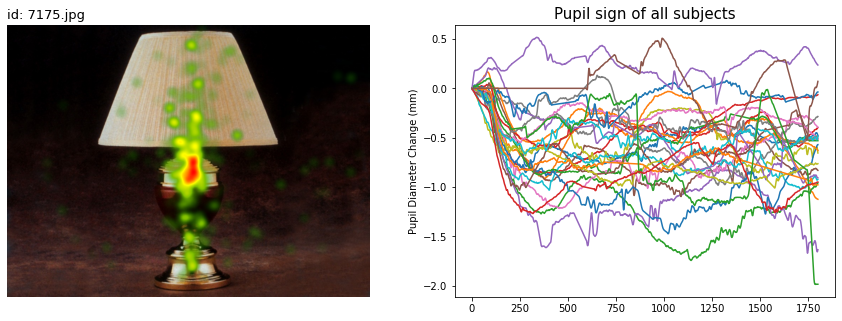

In [55]:
result_id(stimuli[10],st[10])

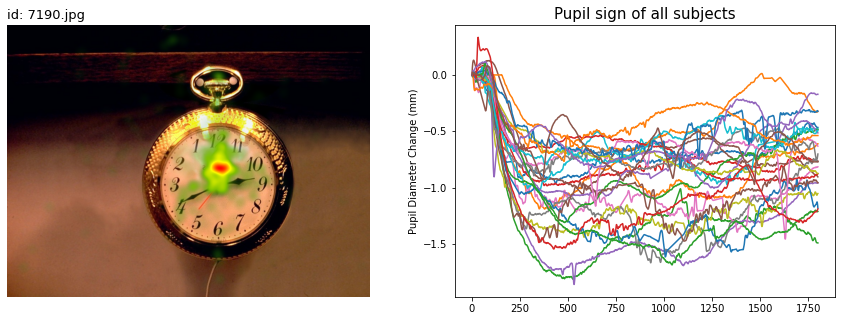

In [56]:
result_id(stimuli[11],st[11]) 

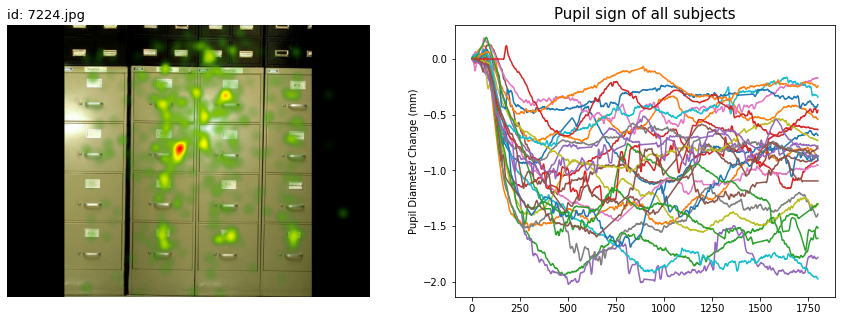

In [57]:
result_id(stimuli[12],st[12]) 

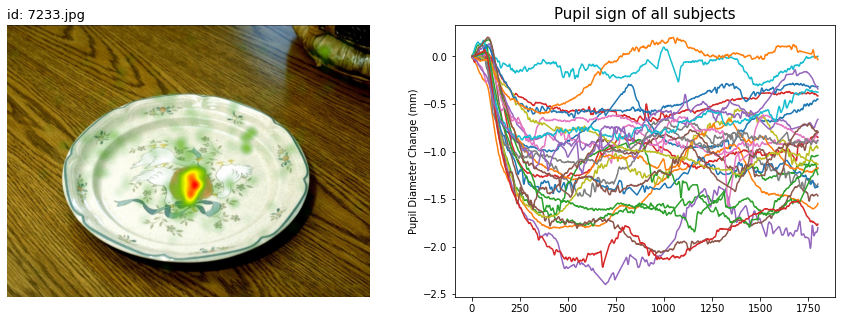

In [58]:
result_id(stimuli[13],st[13]) 

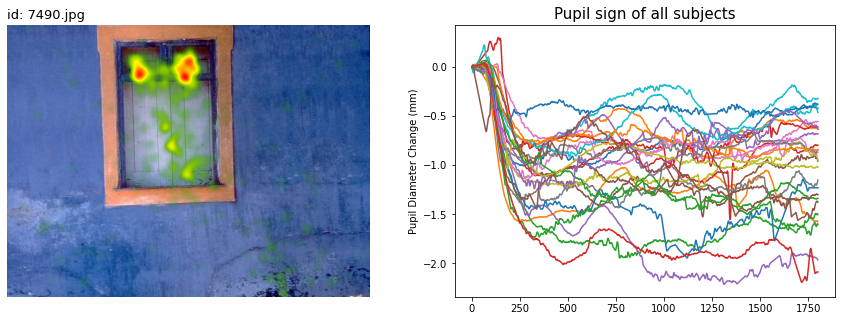

In [59]:
result_id(stimuli[14],st[14]) 

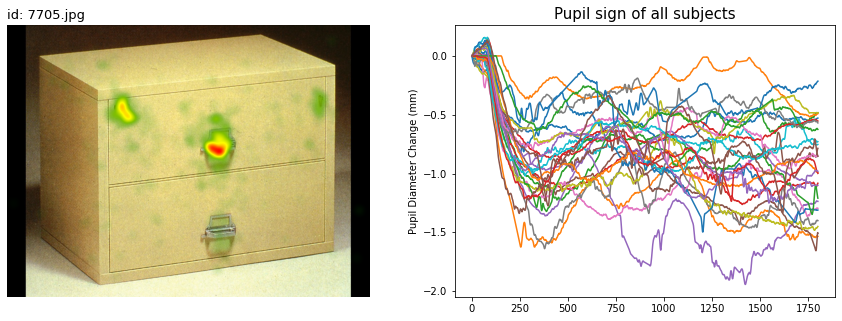

In [60]:
result_id(stimuli[15],st[15])

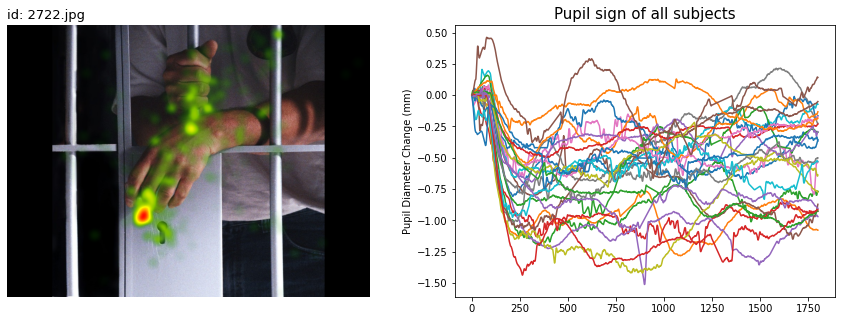

In [61]:
result_id(stimuli[16],st[16]) 

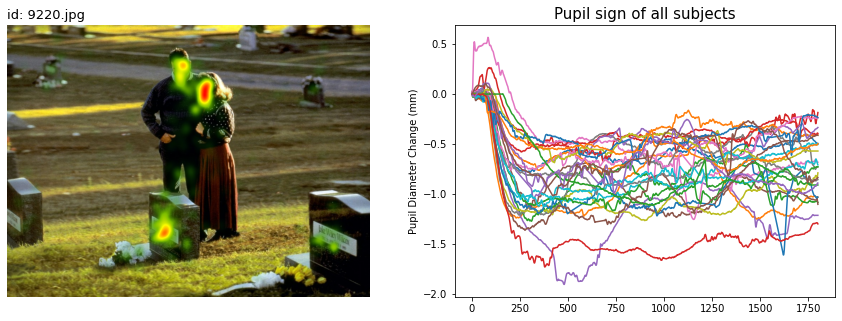

In [62]:
result_id(stimuli[17],st[17]) 

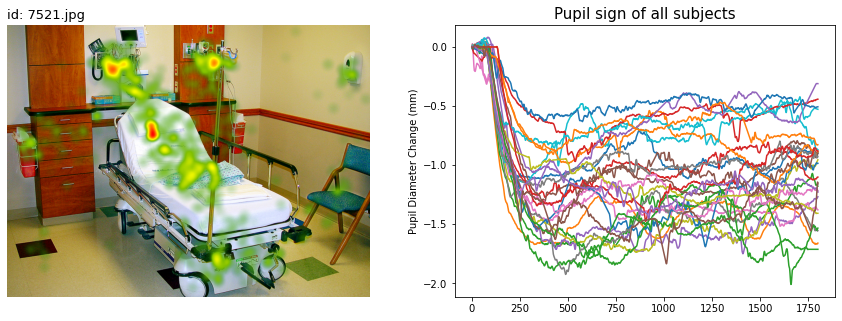

In [63]:
result_id(stimuli[18],st[18]) 

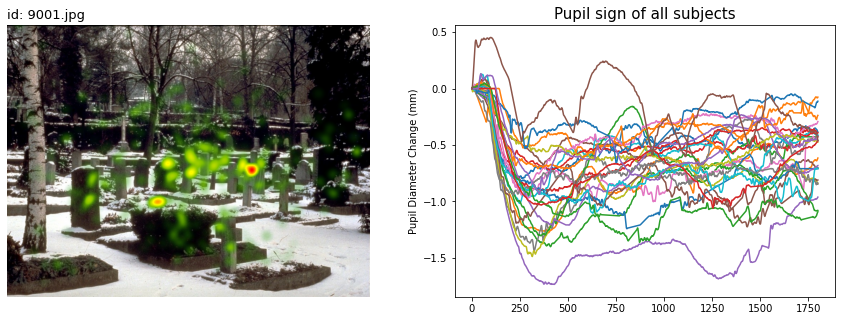

In [64]:
result_id(stimuli[19],st[19]) 

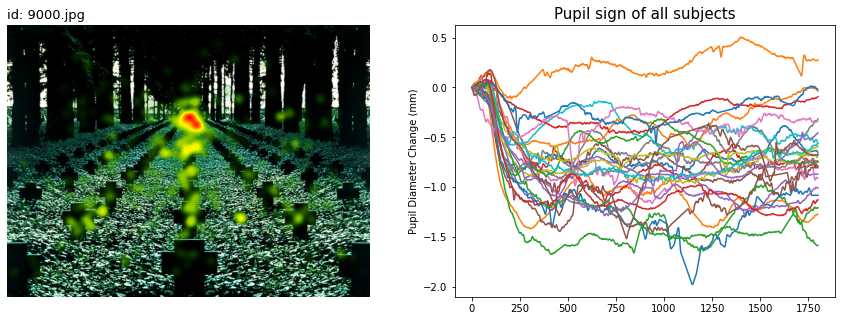

In [65]:
result_id(stimuli[20],st[20]) 

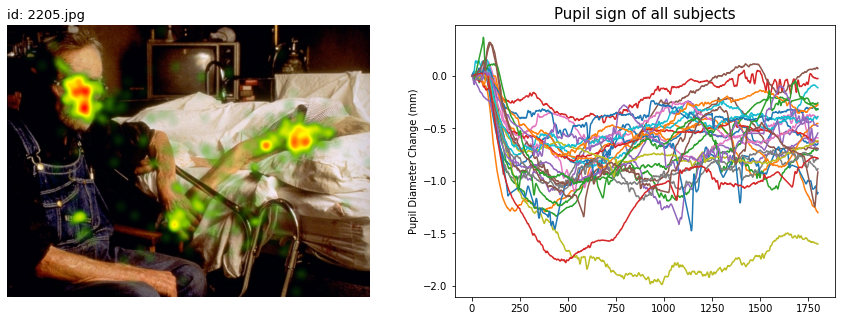

In [66]:
result_id(stimuli[21],st[21]) 

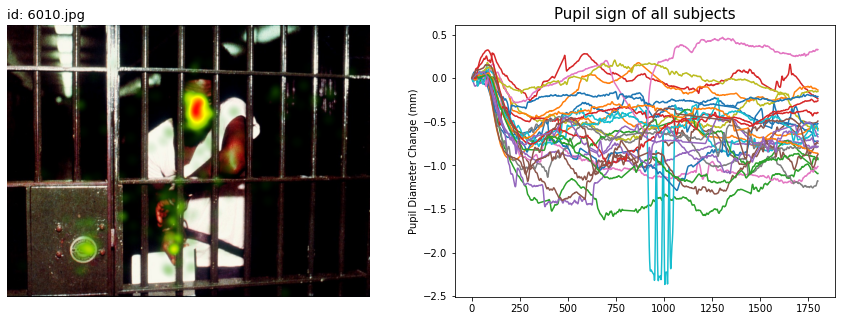

In [67]:
result_id(stimuli[22],st[22]) 

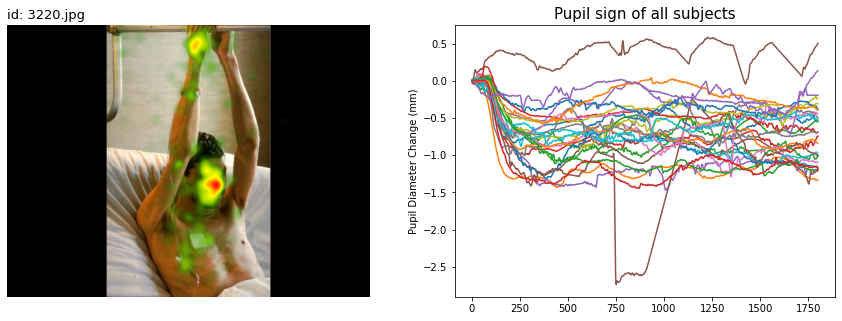

In [68]:
result_id(stimuli[23],st[23]) 

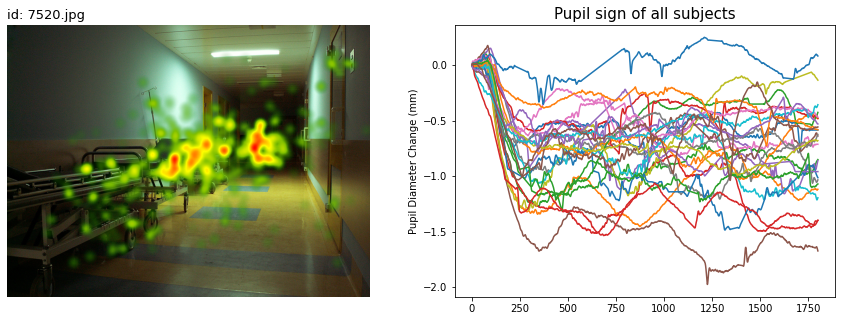

In [69]:
result_id(stimuli[24],st[24]) 

In [70]:
# Function to calculate mean sign by class and by stimulus
def sign_class_cat(classe,stimuli):
    # preallocates space to store pupil sign
    z = np.zeros(shape=(len(classe)*len(stimuli), 1800))  
    k = 0 # Start counter
    for i in classe:
        for j in stimuli:
            # Filter subject and stimulus
            w = df2.loc[(df2["ParticipantName"]==i)&(df2["MediaName"]==j)] 
            z[k,:]=w['Pupil'] # Store subject's sign
            k = k+1 # Increment counter
    y = np.mean(z, axis=0) # Calculate the class mean  
    x = list(range(1,len(y)+1)) # Set the abscissa axis
    return y

In [71]:
# Get sign by class and type of stimulus
e_positive = sign_class_cat(p,positive)
e_neutral = sign_class_cat(p,neutral)
e_negative = sign_class_cat(p,negative)

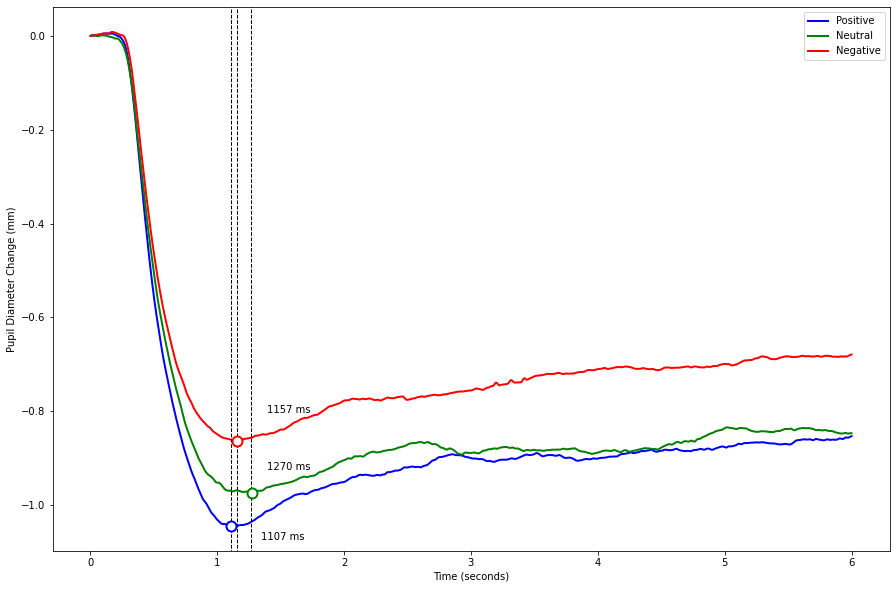

In [72]:
plt.figure(figsize=(15,10)) # Set plot area
x = list(range(1,len(e_positive)+1)) # Set the abscissa axis
g = plt.plot(x,e_positive,'blue',linewidth = 2) # Print mean sign
g = plt.plot(x,e_neutral,'green',linewidth = 2) # Print mean sign
g = plt.plot(x,e_negative,'red',linewidth = 2) # Print mean sign

#g = plt.plot(x,e_pl,'b',linewidth = 2) # Print mean sign
g = plt.axvline(x = [np.argmin(e_positive)], ymin = -0.025, ymax = 1,color = 'black', linestyle = '--', linewidth = 1)
g = plt.axvline(x = [np.argmin(e_neutral)], ymin = -0.025, ymax = 1,color = 'black', linestyle = '--', linewidth = 1)
g = plt.axvline(x = [np.argmin(e_negative)], ymin = -0.025, ymax = 1,color = 'black', linestyle = '--', linewidth = 1)

g = plt.text(x[np.argmin(e_positive)]+70, e_positive[np.argmin(e_positive)]-0.03,
             str(round(np.argmin(e_positive)/300*1000))+str(' ms'), fontsize=10)
g = plt.text(x[np.argmin(e_neutral)]+35, e_neutral[np.argmin(e_neutral)]+0.05,
             str(round(np.argmin(e_neutral)/300*1000))+str(' ms'), fontsize=10)
g = plt.text(x[np.argmin(e_negative)]+70, e_negative[np.argmin(e_negative)]+0.06,
             str(round(np.argmin(e_negative)/300*1000))+str(' ms'), fontsize=10)


g = plt.plot(x[np.argmin(e_positive)], e_positive[np.argmin(e_positive)], 'o', 
             markersize=10, markeredgecolor="blue", markerfacecolor="white", markeredgewidth=2)
g = plt.plot(x[np.argmin(e_neutral)], e_neutral[np.argmin(e_neutral)], 'o', 
             markersize=10, markeredgecolor="green", markerfacecolor="white", markeredgewidth=2)
g = plt.plot(x[np.argmin(e_negative)], e_negative[np.argmin(e_negative)], 'o', 
             markersize=10, markeredgecolor="red", markerfacecolor="white", markeredgewidth=2)

#g = plt.ylim(-0.025, 0.22)
g = plt.legend(['Positive','Neutral','Negative']) # Insert legend
g = plt.ylabel('Pupil Diameter Change (mm)') # Insert label of the ordinate axis
g = plt.xlabel('Time (seconds)') # Insert label of the abscissa axis
g = plt.xticks(ticks=[0,300,600,900,1200,1500,1800], labels=[0,1,2,3,4,5,6])
plt.savefig('meanpupilchange_experts2.pdf')